In [2]:
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

import numpy as np
import pandas as pd
import torch.nn as nn
import torch.nn.functional as F

# Remove all the warnings
import warnings
warnings.filterwarnings('ignore')

# Set env CUDA_LAUNCH_BLOCKING=1
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Retina display
%config InlineBackend.figure_format = 'retina'

try:
    from einops import rearrange
except ImportError:
    %pip install einops
    from einops import rearrange

# Question 1

In [ ]:
if os.path.exists('dog.jpg'):
    print('dog.jpg exists')
else:
    !wget https://segment-anything.com/assets/gallery/AdobeStock_94274587_welsh_corgi_pembroke_CD.jpg -O dog.jpg

--2024-09-18 20:29:40--  https://segment-anything.com/assets/gallery/AdobeStock_94274587_welsh_corgi_pembroke_CD.jpg
Resolving segment-anything.com (segment-anything.com)... 54.230.18.11, 54.230.18.129, 54.230.18.79, ...
Connecting to segment-anything.com (segment-anything.com)|54.230.18.11|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 221810 (217K) [image/jpeg]
Saving to: ‘dog.jpg’

dog.jpg             100%[===================>] 216.61K  --.-KB/s    in 0.04s   

2024-09-18 20:29:41 (5.49 MB/s) - ‘dog.jpg’ saved [221810/221810]



In [ ]:
img = torchvision.io.read_image("dog.jpg")
print(img.shape)

torch.Size([3, 1365, 2048])


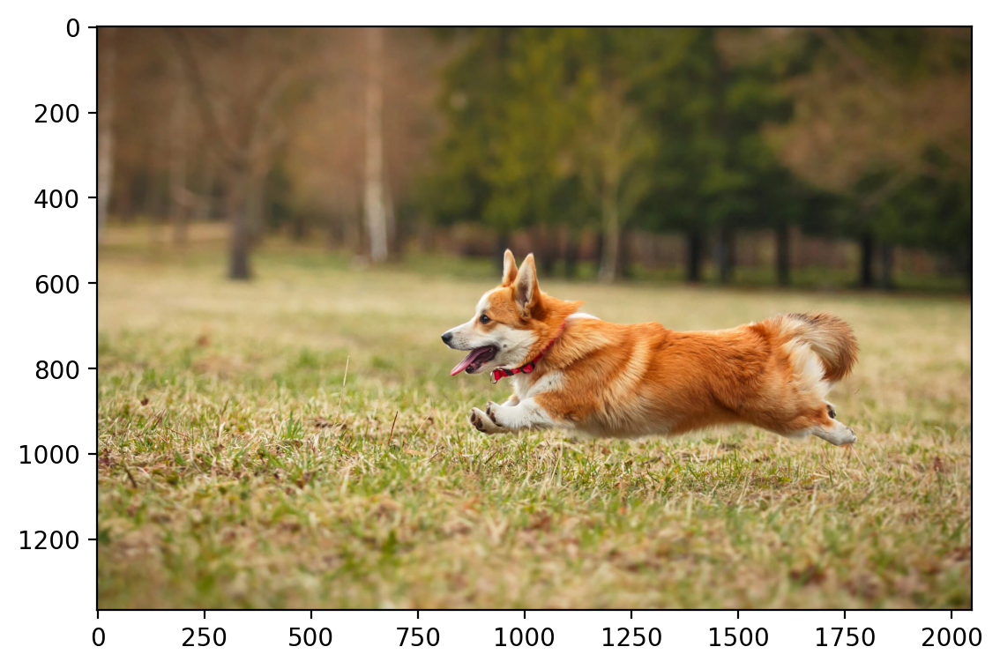

In [ ]:
plt.imshow(rearrange(img, 'c h w -> h w c').numpy())

In [ ]:
from sklearn import preprocessing

scaler_img = preprocessing.MinMaxScaler().fit(img.reshape(-1, 1))
scaler_img

MinMaxScaler()

In [ ]:
img_scaled = scaler_img.transform(img.reshape(-1, 1)).reshape(img.shape)
img_scaled.shape

img_scaled = torch.tensor(img_scaled)

In [ ]:
img_scaled = img_scaled.to(device)
img_scaled

tensor([[[0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         [0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         [0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         ...,
         [0.4745, 0.4745, 0.4784,  ..., 0.3804, 0.3765, 0.3765],
         [0.4745, 0.4745, 0.4784,  ..., 0.3804, 0.3804, 0.3765],
         [0.4745, 0.4745, 0.4784,  ..., 0.3843, 0.3804, 0.3804]],

        [[0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         [0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         [0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         ...,
         [0.4039, 0.4039, 0.4078,  ..., 0.3216, 0.3176, 0.3176],
         [0.4039, 0.4039, 0.4078,  ..., 0.3216, 0.3216, 0.3176],
         [0.4039, 0.4039, 0.4078,  ..., 0.3255, 0.3216, 0.3216]],

        [[0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.1176],
         [0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.1176],
         [0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.

In [ ]:
crop = torchvision.transforms.functional.crop(img_scaled.cpu(), 600, 800, 300, 300)
crop.shape

torch.Size([3, 300, 300])

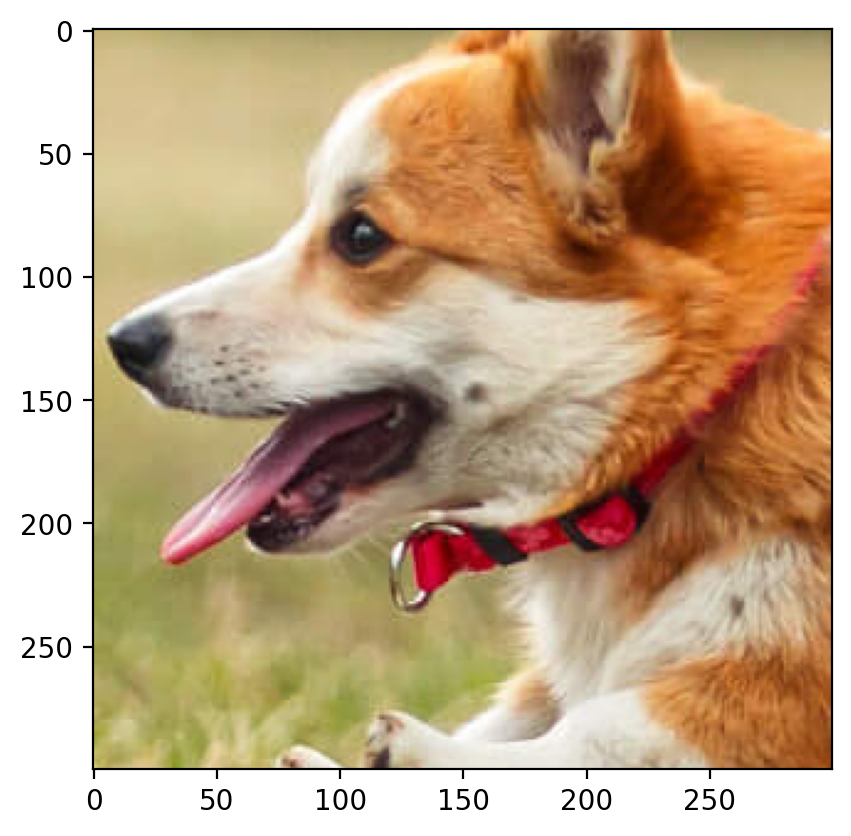

In [ ]:
plt.imshow(rearrange(crop, 'c h w -> h w c').cpu().numpy())

In [ ]:
crop = crop.to(device)

In [ ]:
def create_coordinate_map(img):
    """
    img: torch.Tensor of shape (num_channels, height, width)

    return: tuple of torch.Tensor of shape (height * width, 2) and torch.Tensor of shape (height * width, num_channels)
    """

    num_channels, height, width = img.shape

    # Create a 2D grid of (x,y) coordinates (h, w)
    # width values change faster than height values
    w_coords = torch.arange(width).repeat(height, 1)
    h_coords = torch.arange(height).repeat(width, 1).t()
    w_coords = w_coords.reshape(-1)
    h_coords = h_coords.reshape(-1)

    # Combine the x and y coordinates into a single tensor
    X = torch.stack([h_coords, w_coords], dim=1).float()

    # Move X to GPU if available
    X = X.to(device)

    # Reshape the image to (h * w, num_channels)
    Y = rearrange(img, 'c h w -> (h w) c').float()
    return X, Y

In [ ]:
dog_X, dog_Y = create_coordinate_map(crop)

dog_X.shape, dog_Y.shape

(torch.Size([90000, 2]), torch.Size([90000, 3]))

In [ ]:
# MinMaxScaler from -1 to 1
scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(dog_X.cpu())

# Scale the X coordinates
dog_X_scaled = scaler_X.transform(dog_X.cpu())

# Move the scaled X coordinates to the GPU
dog_X_scaled = torch.tensor(dog_X_scaled).to(device)

# Set to dtype float32
dog_X_scaled = dog_X_scaled.float()

In [ ]:
class LinearModel(nn.Module):
    def __init__(self, in_features, out_features):
        super(LinearModel, self).__init__()
        self.linear = nn.Linear(in_features, out_features)

    def forward(self, x):
        return self.linear(x)

In [ ]:
net = LinearModel(2, 3)
net.to(device)

LinearModel(
  (linear): Linear(in_features=2, out_features=3, bias=True)
)

In [ ]:
def train(net, lr, X, Y, epochs, verbose=True):
    """
    net: torch.nn.Module
    lr: float
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3)
    """

    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=lr)
    for epoch in range(epochs):
        optimizer.zero_grad()
        outputs = net(X)


        loss = criterion(outputs, Y)
        loss.backward()
        optimizer.step()
        if verbose and epoch % 100 == 0:
            print(f"Epoch {epoch} loss: {loss.item():.6f}")
    return loss.item()

In [ ]:
train(net, 0.01, dog_X_scaled, dog_Y, 1000)

Epoch 0 loss: 0.174133
Epoch 100 loss: 0.037489
Epoch 200 loss: 0.036823
Epoch 300 loss: 0.036823
Epoch 400 loss: 0.036823
Epoch 500 loss: 0.036823
Epoch 600 loss: 0.036823
Epoch 700 loss: 0.036823
Epoch 800 loss: 0.036823
Epoch 900 loss: 0.036823


0.03682254999876022

In [ ]:
def plot_reconstructed_and_original_image(original_img, net, X, title=""):
    """
    net: torch.nn.Module
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3)
    """
    num_channels, height, width = original_img.shape
    net.eval()
    with torch.no_grad():
        outputs = net(X)
        outputs = outputs.reshape(height, width, num_channels)
        #outputs = outputs.permute(1, 2, 0)
    fig = plt.figure(figsize=(6, 4))
    gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1])

    ax0 = plt.subplot(gs[0])
    ax1 = plt.subplot(gs[1])

    ax0.imshow(outputs.cpu())
    ax0.set_title("Reconstructed Image")


    ax1.imshow(original_img.cpu().permute(1, 2, 0))
    ax1.set_title("Original Image")

    for a in [ax0, ax1]:
        a.axis("off")


    fig.suptitle(title, y=0.9)
    plt.tight_layout()

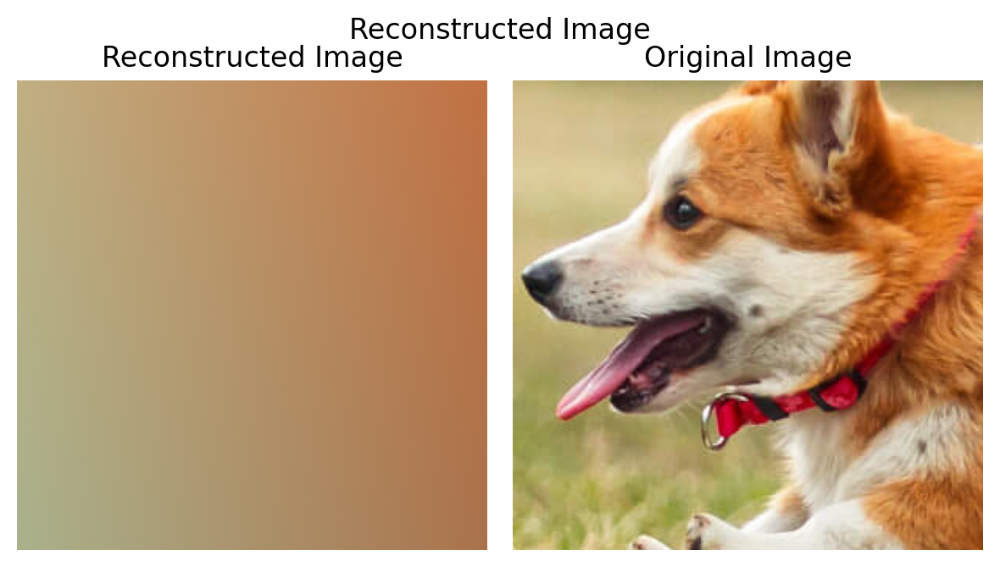

In [ ]:
plot_reconstructed_and_original_image(crop, net, dog_X_scaled, title="Reconstructed Image")

### Random Fourier Features (RFF)

  Random Fourier Features (RFF) is a method used to approximate kernel functions, specifically the Radial Basis Function (RBF) kernel, in a way that enables efficient computations. By transforming data into a higher-dimensional space, RFF allows the use of linear models to approximate non-linear functions.


  Gamma (γ) controls the smoothness of the RBF kernel approximation. In the context of RFF, it determines the spread of the Gaussian function, influencing how much neighboring points affect each other. The formula for gamma in RFF is:

  $$ \gamma = \frac{1}{2\sigma^2} $$

Smaller gamma allows for smooth curves


In [ ]:
# create RFF features
def create_rff_features(X, num_features, sigma):
    from sklearn.kernel_approximation import RBFSampler
    rff = RBFSampler(n_components=num_features, gamma=1/(2 * sigma**2))
    X = X.cpu().numpy()
    X = rff.fit_transform(X)
    return torch.tensor(X, dtype=torch.float32).to(device)

In [ ]:
X_rff = create_rff_features(dog_X_scaled, 37500, 0.008)
X_rff.shape

torch.Size([90000, 37500])

In [ ]:
net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.005, X_rff, dog_Y, 1500)

Epoch 0 loss: 0.369725
Epoch 100 loss: 0.044465
Epoch 200 loss: 0.008014
Epoch 300 loss: 0.003147
Epoch 400 loss: 0.001498
Epoch 500 loss: 0.000769
Epoch 600 loss: 0.000446
Epoch 700 loss: 0.000307
Epoch 800 loss: 0.000249
Epoch 900 loss: 0.000226
Epoch 1000 loss: 0.000216
Epoch 1100 loss: 0.000211
Epoch 1200 loss: 0.000209
Epoch 1300 loss: 0.000207
Epoch 1400 loss: 0.000205


0.00020433605823200196

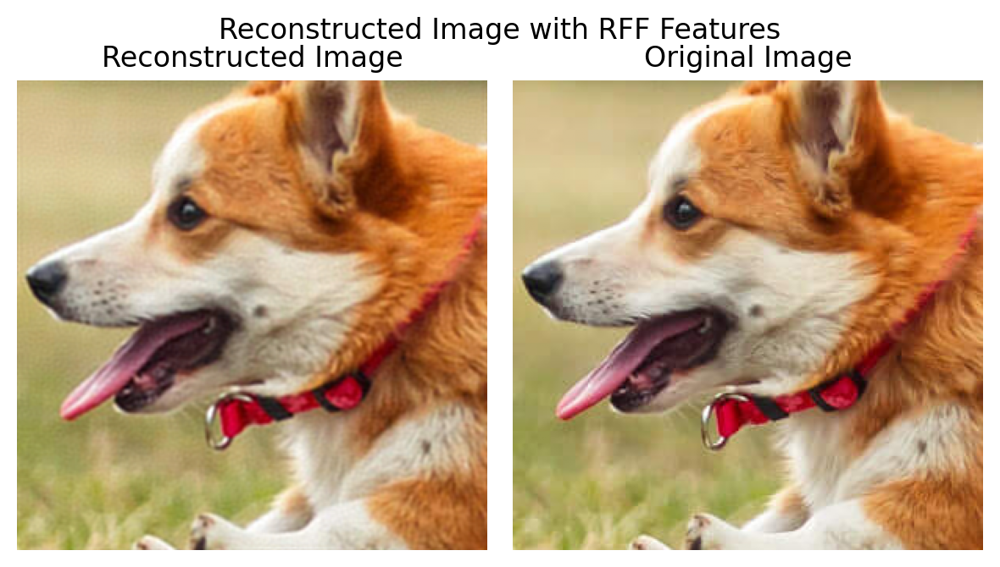

In [ ]:
plot_reconstructed_and_original_image(crop, net, X_rff, title="Reconstructed Image with RFF Features")

Peak signal-to-noise ratio (PSNR) is an engineering term for the ratio between the maximum possible power of a signal and the power of corrupting noise that affects the fidelity of its representation. Because many signals have a very wide dynamic range, PSNR is usually expressed as a logarithmic quantity using the decibel scale.

##### $$ \text{PSNR} = 20 \log_{10}(\frac{\text{MAX}_I}{\sqrt{\text{MSE}}})$$
##### $$ \text{MSE} = \frac{1}{n} \sum_{i=1}^{n} \left( y_{\text{true}}(i) - y_{\text{pred}}(i) \right)^2 $$


In [ ]:
def mse(original_img, reconstructed_img):
    return torch.mean((original_img - reconstructed_img) ** 2)

# Define PSNR function
def psnr(original_img, reconstructed_img, max_pixel_value=1.0):
    mse_value = mse(original_img, reconstructed_img)
    if mse_value == 0:
        return float('inf')  # No noise, perfect reconstruction
    psnr_value = 10 * torch.log10((max_pixel_value ** 2) / mse_value)
    return psnr_value


psnr_value = psnr(dog_Y, net(X_rff))
print(f'PSNR: {psnr_value:.2f} dB')

PSNR: 36.90 dB


In [ ]:
def train(net, lr, X, Y, epochs, verbose=True):
    """
    net: torch.nn.Module
    lr: float
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3)
    """

    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=lr)
    for epoch in range(epochs):
        optimizer.zero_grad()
        outputs = net(X)


        loss = criterion(outputs, Y)
        loss.backward()
        optimizer.step()
        # if verbose and epoch % 100 == 0:
        #     print(f"Epoch {epoch} loss: {loss.item():.6f}")
    print(f"loss: {loss.item():.6f}")
    return loss.item()

loss: 0.034760
PSNR with 1000 features: 14.59 dB
loss: 0.029743


PSNR with 3000 features: 15.27 dB


loss: 0.022956
PSNR with 5000 features: 16.39 dB


loss: 0.011735
PSNR with 10000 features: 19.31 dB


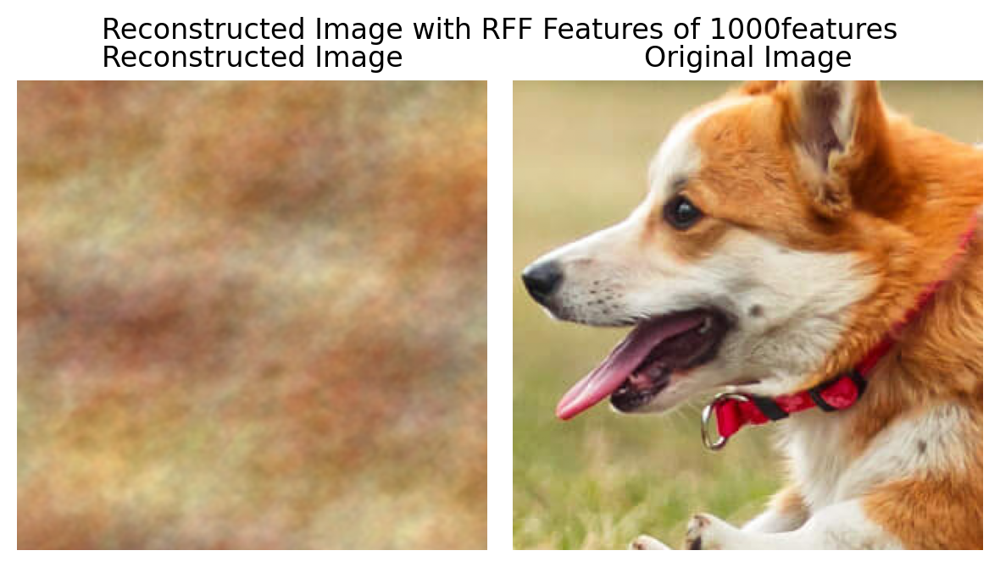

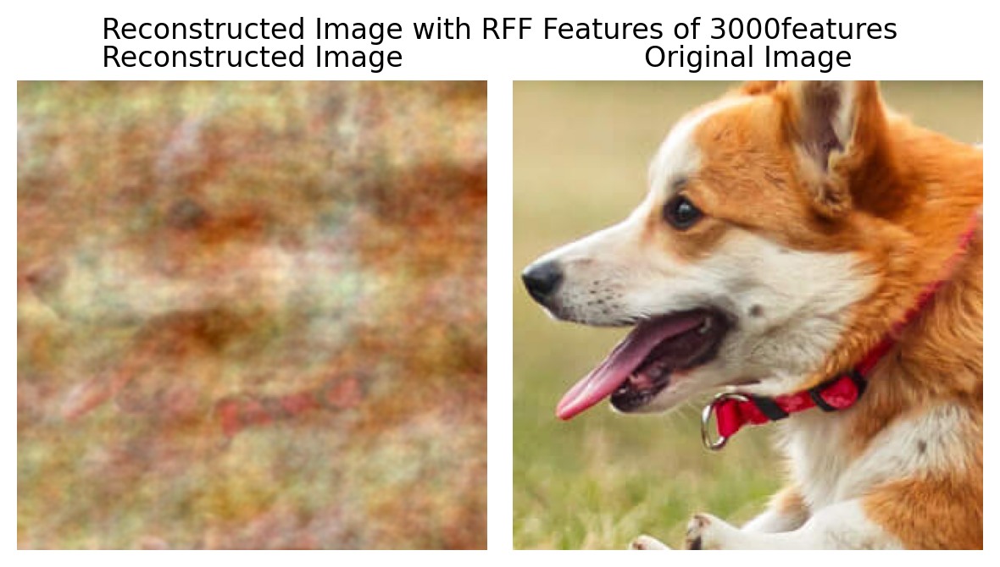

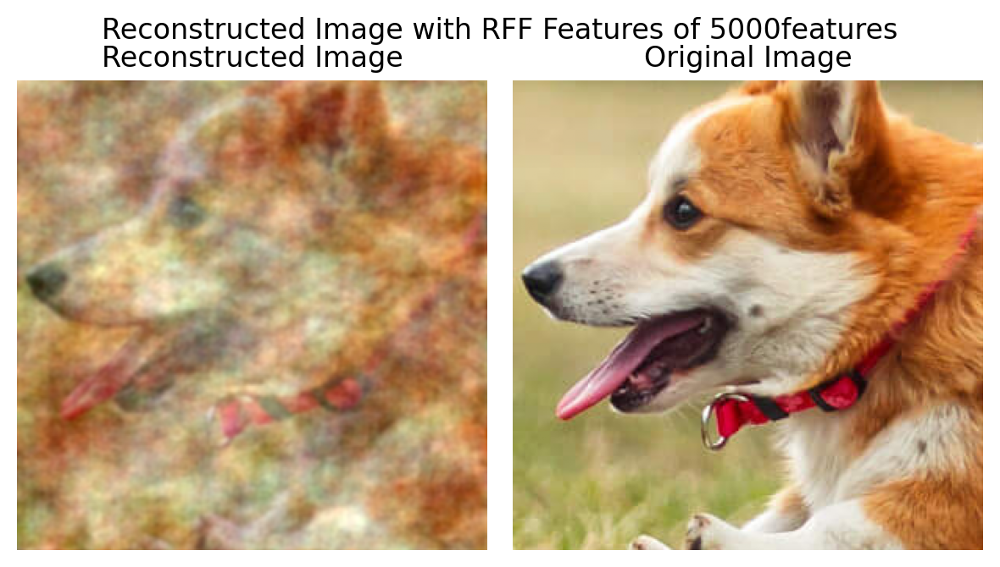

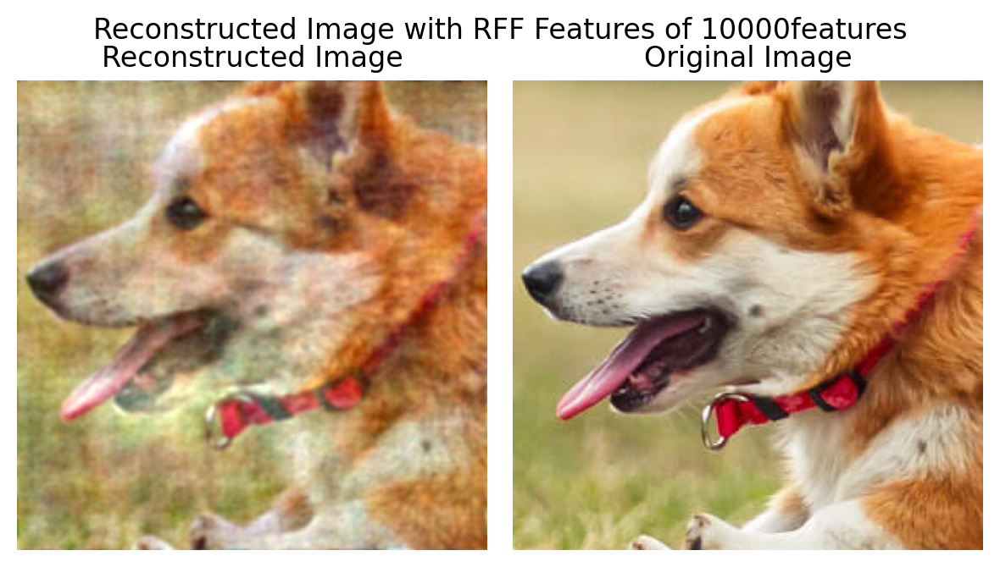

In [ ]:
for num_features in [1000, 3000, 5000, 10000]:
  X_rff = create_rff_features(dog_X_scaled, num_features, 0.008)

  net = LinearModel(X_rff.shape[1], 3)
  net.to(device)
  train(net, 0.005, X_rff, dog_Y, 1500)
  plot_reconstructed_and_original_image(crop, net, X_rff, title="Reconstructed Image with RFF Features of " + str(num_features) + "features")
  psnr_value = psnr(dog_Y, net(X_rff))
  print(f'PSNR with {num_features} features: {psnr_value:.2f} dB')

# Question 2

In [3]:
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
import soundfile

%matplotlib inline
%config InlineBackend.figure_format = "retina"

if torch.backends.mps.is_available():
    device = torch.device("mps")
elif torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")

print(device)

cpu


In [5]:
!wget https://www.vincentsitzmann.com/siren/img/audio/gt_counting.wav

--2024-09-20 05:18:04--  https://www.vincentsitzmann.com/siren/img/audio/gt_counting.wav
Resolving www.vincentsitzmann.com (www.vincentsitzmann.com)... 185.199.109.153, 185.199.111.153, 185.199.110.153, ...
Connecting to www.vincentsitzmann.com (www.vincentsitzmann.com)|185.199.109.153|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2151802 (2.1M) [audio/wav]
Saving to: ‘gt_counting.wav.1’

gt_counting.wav.1   100%[===================>]   2.05M  --.-KB/s    in 0.07s   

2024-09-20 05:18:04 (30.7 MB/s) - ‘gt_counting.wav.1’ saved [2151802/2151802]



In [6]:
from IPython.display import Audio
Audio('gt_counting.wav')

In [7]:
import torchaudio
audio, sr = torchaudio.load('./gt_counting.wav')
sr

44100

In [8]:
print(audio.shape)
audio = audio[0]

torch.Size([1, 537936])


In [9]:
tm = audio.shape[0] / sr
print(f"Audio length: {tm} seconds")

Audio length: 12.198095238095238 seconds


In [10]:
audio

tensor([-0.0015, -0.0018, -0.0019,  ...,  0.0012,  0.0011,  0.0011])

In [11]:
def audio_plot(audio, sr, clr, tl):
    plt.figure(figsize=(15, 4))
    plt.plot(audio, color = clr, alpha = 0.7)
    plt.xticks(np.arange(0, audio.shape[0], sr), np.arange(0, audio.shape[0] / sr, 1))
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.title(tl)
    plt.grid()
    plt.show()

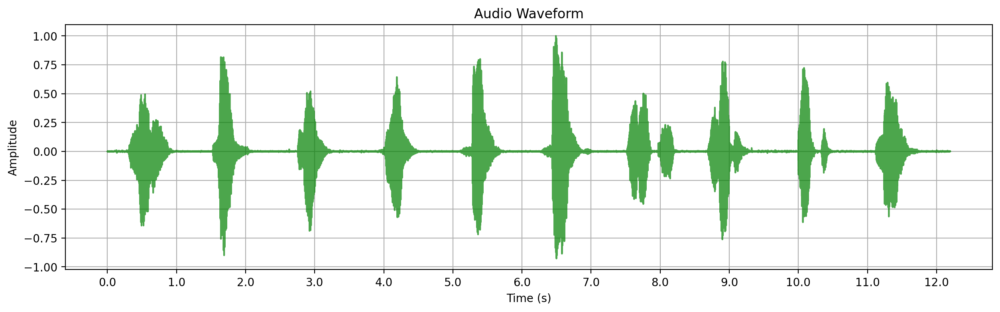

In [12]:
audio_plot(audio, sr, 'green', 'Audio Waveform')

In [13]:
audio = audio[-5 * sr:]
print(audio.shape)
print(audio)

torch.Size([220500])
tensor([0.0008, 0.0005, 0.0007,  ..., 0.0012, 0.0011, 0.0011])


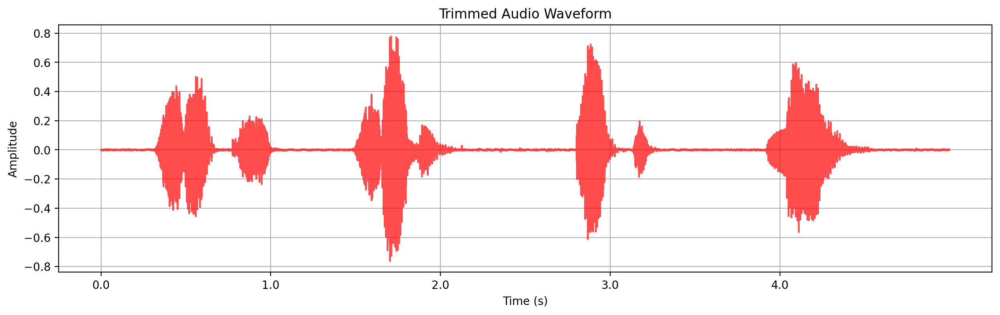

In [14]:
audio_plot(audio, sr, 'red', 'Trimmed Audio Waveform')

In [15]:
X = torch.arange(0, len(audio)).unsqueeze(1).float()
X = X / X.max() * 200 - 100
print(X.shape)
print(X)

torch.Size([220500, 1])
tensor([[-100.0000],
        [ -99.9991],
        [ -99.9982],
        ...,
        [  99.9982],
        [  99.9991],
        [ 100.0000]])


In [16]:
Audio(audio, rate = sr)

In [17]:
from sklearn.kernel_approximation import RBFSampler

def create_rff_features(X, num_features, sigma):
    # Set a random state to the sampler for repoducibility
    rff = RBFSampler(n_components = num_features, gamma = 1 / (2 * sigma**2), random_state = 13)
    X = X.cpu().numpy()
    X = rff.fit_transform(X)
    return torch.tensor(X, dtype = torch.float32)

In [26]:
num_features = 10000
sigma = 0.008

X_rff = create_rff_features(X, num_features, sigma)
print(X_rff.shape)
print(X_rff)

torch.Size([220500, 10000])
tensor([[-0.0133, -0.0113,  0.0069,  ...,  0.0140, -0.0071, -0.0140],
        [-0.0129, -0.0105,  0.0068,  ...,  0.0138, -0.0093, -0.0141],
        [-0.0123, -0.0096,  0.0067,  ...,  0.0134, -0.0111, -0.0139],
        ...,
        [ 0.0136, -0.0029,  0.0009,  ...,  0.0121,  0.0140,  0.0004],
        [ 0.0133, -0.0017,  0.0008,  ...,  0.0114,  0.0135, -0.0019],
        [ 0.0129, -0.0005,  0.0008,  ...,  0.0106,  0.0124, -0.0042]])


In [27]:
from sklearn.linear_model import LinearRegression

model = LinearRegression()
model.fit(X_rff.numpy(), audio)

pred_audio = model.predict(X_rff.numpy())
print(pred_audio.shape)

(220500,)


In [28]:
import joblib
joblib.dump(model, 'model.pkl')
model = joblib.load('model.pkl')

import soundfile as sf
sf.write('pred_audio.wav', pred_audio, sr)

In [29]:
print(pred_audio)
print(audio)
pred_audio.shape, np.max(pred_audio)


[ 0.00293127  0.00195471  0.00915304 ... -0.01653323 -0.0270637
 -0.02542719]
tensor([0.0008, 0.0005, 0.0007,  ..., 0.0012, 0.0011, 0.0011])


((220500,), 0.35412374)

In [30]:
np.linalg.norm(pred_audio - audio.numpy()), np.linalg.norm((pred_audio - audio.numpy()), ord = 1)

(24.601677, 7065.7817)

In [31]:
Audio(pred_audio, rate = sr)

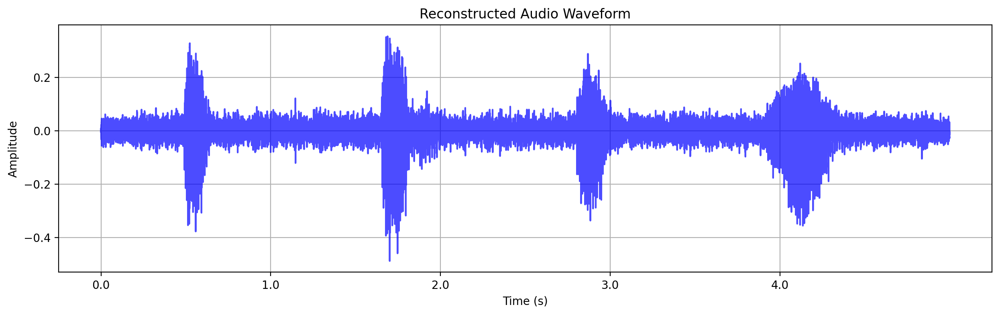

In [32]:
audio_plot(pred_audio, sr, 'blue', 'Reconstructed Audio Waveform')

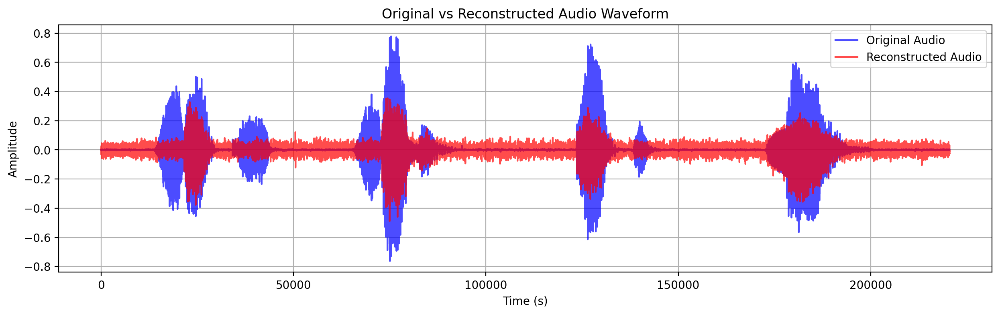

In [33]:
plt.figure(figsize=(15, 4))
plt.plot(audio, color = 'blue', alpha = 0.7, label = 'Original Audio')
plt.plot(pred_audio, color = 'red', alpha = 0.7, label = 'Reconstructed Audio')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Original vs Reconstructed Audio Waveform')
plt.grid()
plt.legend()
plt.show()

Signal-to-noise ratio (SNR or S/N) is a measure used in science and engineering that compares the level of a desired signal to the level of background noise. SNR is defined as the ratio of signal power to noise power, often expressed in decibels.

#### $$ \text{SNR} = 10 \log_{10} \left( \frac{P_{\text{signal}}}{P_{\text{noise}}} \right) $$

$$ P_{\text{signal}} = \frac{1}{n} \sum_{i=1}^{n} \left( y_{\text{signal}}(i) \right)^2 $$
$$ P_{\text{noise}} = \frac{1}{n} \sum_{i=1}^{n} \left( y_{\text{true}}(i) - y_{\text{pred}}(i) \right)^2 $$


In [34]:
def calculate_snr(signal, noise):

    signal = signal.numpy()

    # Ensure both arrays have the same dtype
    if signal.dtype != noise.dtype:
        signal = signal.astype(noise.dtype)

    # Step 1: Calculate signal power and noise power
    signal_power = np.mean(signal ** 2)
    noise_power = np.mean(noise ** 2)

    if noise_power == 0:  # No noise present
        return float('inf')

    # Step 2: Calculate SNR
    snr = 10 * np.log10(signal_power / noise_power)

    return snr

snr_value = calculate_snr(audio, pred_audio)
print(f"SNR: {snr_value} dB")


SNR: 2.9557228088378906 dB
